# Farina in Natura

In [4]:
from IPython import display

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# import seaborn as sns; sns.set()
import datetime
import nbformat
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode (connected = True )
import plotly.graph_objs as go
import plotly.offline as py
from matplotlib.backends.backend_pdf import PdfPages
from fpdf import FPDF
pd.options.display.max_columns = None
pd.options.display.max_rows = None
import locale

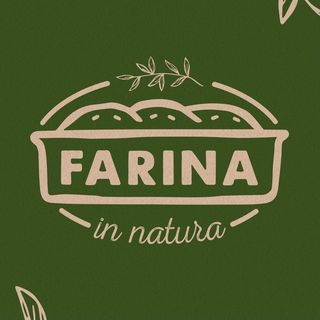

In [6]:

display.Image("/home/claudio/farina_in_natura001/images/Logo_farina_in_natura_edited.jpg",width=215)


## Relatório - Análise de dados operacionais - ano 2022

In [7]:
# Importando os dados e observações iniciais.

O método utilizado para a análise dos dados do estabelecimento Farina in Natura foi a análise de dados exploratória. Isso significa que foram realizadas diversas técnicas estatísticas para explorar e compreender melhor os dados, a fim de obter informações relevantes sobre os acontecimentos passados do estabelecimento.

O período analisado foi 01 fevereiro de 2022 a 31 de Outubro 2022

## Primeiras descobertas

<p> Na análise realizada, a primeira descoberta foi uma divergência nos dados de vendas de itens e faturamento. Após uma análise mais aprofundada, foi constatado que essa divergência foi causada pela falta de entrada de dados no sistema, o que afetou especialmente a venda de croissants. Foi observado que o valor de venda dos croissants era superior ao valor correspondente à sua quantidade, o que sugere a falta de informação referente aos recheios utilizados.</p>

<p> Essa falta de informação é um comportamento não ideal, uma vez que deixamos de saber quais são realmente as preferências do cliente no que diz respeito aos recheios dos croissants. Isso pode afetar negativamente a tomada de decisão do estabelecimento em relação ao estoque de ingredientes, bem como na oferta de produtos mais alinhados com o gosto dos clientes.</P>

In [8]:
# para resolver o problema: "(unicode error) 'utf-8' codec can't decode "
# https://www.youtube.com/watch?v=ZSC7X4N8RKo,
#Erro: 
# UnicodeDecodeError: 'utf-8' codec can't decode byte 0xe9 in position 900: invalid continuation byte
# enem = pd.read_csv("MICRODADOS_ENEM_2020.csv", encoding="utf-8", sep = ';')
# enem = pd.read_csv("MICRODADOS_ENEM_2020.csv", encoding="ISO-8859-1", sep = ';')

transactions = pd.read_csv(r'/home/claudio/farina_in_natura001/CSV/farina.CSV', 
encoding="ISO-8859-1", sep = ';')

In [9]:
# Limpeza e manipulação dos dados.

In [10]:
%%capture
# use line magic function (%%capture)
# CHECK OUT IF THE NUMBER OF TOTAL ENTRIES IS EQUAL TO THE NUMBER OF ENTRIES OF THE VARIABLES  

transactions.isnull().sum()

In [11]:
## DROPPING THE ROWS THAT ALL COLUMN VALUES ARE NULL
#  https://www.youtube.com/watch?v=uDr67HBIPz8&t=818s

transactions = transactions.dropna(how='all')
# Delete the column "item"

del transactions["item"]
## Using isna() to select all rows with NaN in the column ('mesa') and the value "CONSUMIDOR" on the column "cliente" 
## and replace the "mesa" value with "M0"
## https://datatofish.com/rows-with-nan-pandas-dataframe/
## https://www.geeksforgeeks.org/how-to-replace-values-in-column-based-on-condition-in-pandas/

transactions.loc[(transactions["cliente"] == 'CONSUMIDOR') &  (transactions['mesa'].isna()), 'mesa']= 'M0'

# Assigning a value "ND" to the empty records in column "mesa"
# https://www.w3schools.com/python/pandas/pandas_cleaning_empty_cells.asp

transactions['mesa'].fillna("ND",inplace = True )
# Convert the "venda" variable from float64 type to integer type
# https://stackoverflow.com/questions/43956335/convert-float64-column-to-int64-in-pandas

transactions['venda'] = np.int64(transactions['venda'])
# Convert the "quantidade" variable from float64 type to integer type
# https://stackoverflow.com/questions/43956335/convert-float64-column-to-int64-in-pandas

transactions['quantidade'] = np.int64(transactions['quantidade'])
# change the decimal separator of the the variable "valor_unit" from "," to "."
# https://cursos.alura.com.br/forum/topico-transformar-pontos-por-virgulas-dentro-de-um-dataframe-121090
transactions['valor_unit'] = transactions['valor_unit'].str.replace(",",".")

# Convert the "valor_uni" variable from object type to float64 type
# https://www.statology.org/pandas-convert-object-to-float/

transactions['valor_unit'] = transactions['valor_unit'].astype(float)
# change the decimal delimiter of the the variable "total_item" from "," to "."
# https://cursos.alura.com.br/forum/topico-transformar-pontos-por-virgulas-dentro-de-um-dataframe-121090
transactions['total_item'] = transactions['total_item'].str.replace(",",".")

# Convert the "total_item" variable from object type to float64 type
# https://www.statology.org/pandas-convert-object-to-float/

transactions['total_item'] = transactions['total_item'].astype(float)


# Convert "data_hora" to datetime object
transactions['data_hora'] = pd.to_datetime(transactions['data_hora'], format='%d/%m/%Y %H:%M')

# Creating a horario column that is a copy of data_hora and coverting it to datetime and extracting only the day;
transactions['horario'] = (transactions['data_hora'])
transactions['horario'] = transactions['horario'].dt.date

#How to Solve Python ValueError: unconverted data remains
#read://https_researchdatapod.com/?url=https%3A%2F%2Fresearchdatapod.com%2Fhow-to-solve-python-valueerror-unconverted-data-remains%2F

# https://www.dataquest.io/blog/python-datetime-tutorial/


# add hora and minuto column; using class attributes .hour and .minute

transactions['hora'] = transactions.data_hora.dt.hour
transactions['minuto'] = transactions.data_hora.dt.minute


### Creating a column name 'hora_minuto'
# https://gist.github.com/krisbolton/aef6179ecf906892565d326b979b3a5b
# https://www.youtube.com/watch?v=TbXaP56Omuc


transactions['hora_minuto']=pd.to_datetime(transactions['data_hora'])

transactions['hora_minuto'] = transactions['hora_minuto'].dt.time
### Creating the column "data" baseadao em "data_hora"
transactions['data'] = transactions['data_hora'].dt.normalize()
### Extracting only the Date from 'data' column

## https://datagy.io/pandas-extract-date-from-datetime/
transactions['data'] = transactions['data_hora'].dt.normalize()
# Definindo a função time_of_day
def time_of_day(hora):
    """
    Determina se a  compra foi feita pela manhã, tarde ou noite.
    """
    
    if hora < 12:
        
        return 'manhã'
    
    elif hora < 17:
        
        return 'tarde'
    
    else:
        
        return 'noite'

In [12]:
# Apply time of day function to 'hora' column

transactions['time_of_day'] = transactions.hora.apply(time_of_day)

# https://pt.stackoverflow.com/questions/508484/mostrar-dias-da-semana#:~:text=Como%20weekday()%20retorna%20um,fim%20de%20semana%20ou%20n%C3%A3o.


# setar locale para português para que os dias da semana retornem em portugês no código abaixo.
locale.setlocale(locale.LC_ALL, 'pt_BR.utf-8')

# Add a day of week variable and a second classifier of weekday or weekend

from datetime import date
import calendar

transactions['day_of_week'] = [calendar.day_name[i.weekday()] for i in transactions['horario']]


transactions['day_type'] = ['FDS' if (i == 'domingo') | (i == 'sábado') else 'DDS' for i in 
                                                                            transactions['day_of_week']]

transactions.rename(columns = {'day_of_week':'dia_da_semana'}, inplace = True)
transactions.rename(columns = {'time_of_day':'hora_do_dia'}, inplace = True)
transactions.rename(columns = {'day_type':'tipo_de_dia'}, inplace = True)
# Add an item count variable equal to one for future groupby operations

transactions['item_count'] = 1


# Verificando divergência dos dados

In [13]:
# Verificando se o valor "total_item" é igual a: "quantidade" * "valor_unit"

transactions["total_item_verif"] = transactions['quantidade']* transactions['valor_unit']

In [14]:
# Continuando o item anterior
# https://www.dataquest.io/blog/tutorial-add-column-pandas-dataframe-based-on-if-else-condition/

transactions['confirm'] = np.where(transactions['total_item'] > transactions['total_item_verif'], True, False)


In [15]:
#### Creating a Column diference

In [16]:

transactions['diference']=(transactions['total_item'])-(transactions['total_item_verif'])

In [17]:
# continuando o item anterior
resumo = transactions.loc[transactions["confirm"] == True, ["total_item", "total_item_verif", 'diference']].sum()


# print (resumo)

In [18]:
### Gerando um relatório dos dados divergentes

In [19]:

# How do I select specific rows and columns from a DataFrame?
# https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html#how-do-i-select-specific-rows-and-columns-from-a-dataframe
# https://www.geeksforgeeks.org/select-rows-columns-by-name-or-index-in-pandas-dataframe-using-loc-iloc/

ts2 = transactions.loc[transactions["confirm"] == True, ["venda", "data","produto", "quantidade", "valor_unit", "total_item", "total_item_verif"]]

In [20]:
### Criando um arquivo HTML dos dados divergentes usando Plotly ("ts2" dataframe)

In [21]:
# GRÁFICO 01

In [22]:
fig_divergentes = go.Figure(data=[go.Table(
    header=dict(values=list([
    "Venda","Data", "Produto", "Quantidade", "Valor unitário(R$)", "Quanidade x Valor Unitário (R$)", "Valor Faturado(R$)"
    ]),
                font=dict(color='white', size=12), # configurando a cor e tamanho da letra
                fill_color='seagreen',
                align='left'),
    cells=dict(values=[ts2['venda'], ts2['data'], ts2['produto'], ts2['quantidade'], ts2['valor_unit'],ts2['total_item_verif'] , ts2['total_item'] ],
               fill_color='lightcyan',
               align='left'))
])


fig_divergentes.update_layout(
    title={
        'text': "Dados divergentes - Valores de venda - (Fev 2022 - Out 22)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

py.iplot(fig_divergentes, filename='/home/claudio/results/grafico01 - Dados_divergentes_vendas.html')

 Observamos na tabela acima que o valor faturado nesses itens, sempre é maior do que o valor unitário do item multiplicado por sua quantidade, o que sugere que algum adicional foi solicitado pelo cliente, mas não foi discriminado como mais um item do pedido.


In [23]:
# drop the 'confirm" and "total_item_verif" column

transactions = transactions.drop(['confirm'], axis=1)
transactions = transactions.drop(['total_item_verif'], axis=1)
transactions = transactions.drop (['diference'], axis=1)

<p> Após a análise inicial dos dados do estabelecimento Farina in Natura, foi realizada a conversão dos dados brutos e a posterior limpeza das informações. Esse processo envolveu a identificação de dados incorretos ou incompletos, bem como a exclusão de variáveis que não eram relevantes para a análise.</p>

<p> Algumas variáveis que foram enviadas pelo cliente apresentavam uma quantidade significativa de falta de dados, o que tornava difícil a sua utilização na análise. Dessa forma, essas variáveis foram descartadas, a fim de garantir a confiabilidade dos resultados obtidos</p>

<p>Outras variáveis, por sua vez, foram omitidas da análise por não estarem no escopo do projeto.</p>

# **Exploração dos Dados**

In [24]:
# Find Unique Values of each item sold in the Column "produto"
# https://www.statology.org/pandas-unique-values-in-column/
# Pandas: get first 10 elements of a series
top_produtos = transactions.produto.value_counts()


## Ranking dos produtos mais vendidos

In [25]:
### Converting a Series to a dataframe and changing the namee of the column

In [26]:
top_produtos_df = top_produtos.to_frame()


In [27]:
top_produtos_df = top_produtos_df.reset_index()

In [28]:
top_produtos_df.rename(columns = {'produto':'quantidade', 'index':'produto'}, inplace = True)


In [29]:
### Criando um arquivo HTML usando Plotly

In [30]:
# GRÁFICO 02

In [31]:
fig_top_produtos = go.Figure(data=[go.Table(
    header=dict(values=list(top_produtos_df.columns),
                font=dict(color='white', size=12), # configurando a cor e tamanho da letra
                fill_color='seagreen',
                align='left'),
    cells=dict(values=[top_produtos_df['produto'], top_produtos_df['quantidade'] ],
               fill_color='lightcyan',
               align='left'))
])


fig_top_produtos.update_layout(
    title={
        'text': "Produtos mais vendidos - (Fev 2022 - Out 22)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

py.iplot(fig_top_produtos, filename='/home/claudio/results/grafico02 - Top_products_2022.html')

A tabela apresentada acima contém o ranking dos itens vendidos ao longo do período de análise no estabelecimento Farina in Natura. A análise desses dados revela que os principais produtos vendidos são relacionados à panificação própria do estabelecimento, sendo que o carro-chefe é o Croissant.

In [32]:
### Find the percentage of itens sold

In [33]:
# find the percentage each item is selling
top_produtos_perc = transactions.produto.value_counts(True)
# print (top_produtos_perc[:10])

In [34]:
#### Converting to a Dataframe

In [35]:
top_produtos_perc_df = top_produtos_perc.to_frame().reset_index()


In [36]:
top_produtos_perc_df.rename(columns = {'produto':'proporção', 'index':'produto'}, inplace = True)


In [37]:
# inserting a column Ranking based on the value of the column proporção


In [38]:
# https://www.dataquest.io/blog/tutorial-add-column-pandas-dataframe-based-on-if-else-condition/

In [39]:
# if a prduct has a percentage greater than 1,7%, its ranked, 
# if lower than this its aggregate with 'outros'

top_produtos_perc_df['ranking']= np.where (
    top_produtos_perc_df['proporção']> 0.0170, 
    top_produtos_perc_df['produto'], 'outros' )

O gráfico apresentado abaixo representa a quantidade de itens vendidos por produto, de forma proporcional às vendas totais de todos os itens no período analisado.
<p> Esse tipo de representação visual permite uma rápida compreensão da contribuição de cada produto para as vendas totais do estabelecimento, facilitando a identificação dos produtos mais populares entre os clientes e a avaliação do desempenho de cada categoria de produtos.</p>
<p> Dessa forma, essa análise pode ser utilizada para identificar oportunidades de melhoria no portfólio de produtos oferecidos, bem como na definição de estratégias de marketing e precificação.</p>

In [40]:
# Criando um arquivo html usando Plotly

In [41]:
# Gráfico 03

In [42]:
# fig_top_produtos_perc = go.Figure(data=[go.Table(
    # header=dict(values=list(top_produtos_perc_df.columns),
                #font=dict(color='white', size=12), # configurando a cor e tamanho da letra
                #fill_color='seagreen',
                #align='left'),
    #cells=dict(values=[top_produtos_perc_df['produto'], 
                       #top_produtos_perc_df['proporção'],
                       # top_produtos_perc_df['ranking'] ],
               #fill_color='lightcyan',
               #align='left'))
#])


#fig_top_produtos_perc.update_layout(
    #title={
       # 'text': "Produtos mais vendidos proporcional - (Fev 2022 - Out 22)",
      #  'y':0.95,
      #  'x':0.5,
      #  'xanchor': 'center',
      #  'yanchor': 'top'})

#py.iplot(fig_top_produtos_perc, filename='/home/claudio/results/grafico03 - top_products_proporc_2022.html')

In [43]:
# Inserir um gráfico de pizza da tabela acima

In [44]:
# GRÁFICO 3A

In [45]:
fig_pie_3 = go.Figure(data=[go.Pie(labels=top_produtos_perc_df['ranking'], values=top_produtos_perc_df['proporção'])])

fig_pie_3.layout = dict(title="Percentual dos itens mais vendidos (Fev 2022 - Out 22) <br><sup></sup>", showlegend=True
)

fig_pie_3.update_traces(hoverinfo='label+percent', textfont_size=11,
                  )

py.iplot(fig_pie_3, filename='/home/claudio/results/grafico03A - Percetual_dos_itens_mais_vendidos.html')

<p> É possível observar que há uma enorme variedade no mix de produtos disponíveis, com um total de 212 produtos distintos vendidos no período analisado. No gráfico acima, os 12 itens em destaque representam os mais vendidos dentre todos. Entretanto, é importante ressaltar que os 200 produtos restantes, que não estão em destaque, correspondem a 64% das vendas totais no período.</p>

<p> Acredito que um mix reduzido de produtos poderia contribuir para uma gestão de estoque mais eficiente, além de facilitar o planejamento e a implementação de estratégias promocionais, como a criação de combos de produtos. Isso porque um mix menor permitiria um melhor controle dos itens em estoque, ajudando a reduzir custos com armazenagem e diminuindo o risco de obsolescência de produtos pouco comercializados.</p>


## Algumas métricas importantes foram observadas

In [46]:
## Get unique names in the "produto" column using Series.unique() 
## https://sparkbyexamples.com/pandas/pandas-count-unique-values-in-column/
num_itens_vend = transactions.produto.unique().size

print('O número de diferentes itens vendido pela loja é:', num_itens_vend)

O número de diferentes itens vendido pela loja é: 212


In [47]:
# achando a média do numero de itens vendidos por dia
grouped_by_date = pd.DataFrame(transactions.groupby(by='horario')['item_count'].sum()).reset_index()
print('O número médio de itens vendidos em um dia é: \n{0}'.format(
    grouped_by_date.item_count.mean().round(decimals = 2)))

O número médio de itens vendidos em um dia é: 
102.74


In [48]:
# Look at the average number of items purchased...

avg_items = transactions.groupby(by='venda')['produto'].count().mean()

print('A média de itens por venda é: %.2f itens' %avg_items)

A média de itens por venda é: 2.79 itens


In [49]:
# ...and how that varies by time of day

single_transaction = pd.DataFrame(transactions.groupby(by='venda')['item_count'].sum())

single_transaction = single_transaction.merge(transactions[['hora','minuto','hora_do_dia','data', 'venda']]\
                                              .drop_duplicates('venda'), left_on=single_transaction.index, 
                                              right_on='venda', how='left', copy=False)

st01 = single_transaction.groupby(by='hora_do_dia')['item_count'].mean().round (decimals=2)
st01 = st01.to_frame().reset_index()
st01.rename(columns = {'hora_do_dia':'Período', 'item_count':'Média'}, inplace = True)

print('O número médio de itens vendidos em cada pedido po período do dia é: \n{0}'.format(st01.sort_values(by=['Média'],ascending=False)))

O número médio de itens vendidos em cada pedido po período do dia é: 
  Período  Média
0   manhã   3.05
2   tarde   2.78
1   noite   2.66


<p>Ao analisar os dados apresentados, notamos que os períodos de maior venda de itens ocorrem principalmente durante a manhã, com uma média superior a três itens por pedido. Essa informação nos permite identificar oportunidades para aumentar a quantidade de itens vendidos por pedido também nos demais períodos, de forma a maximizar as vendas e a rentabilidade do negócio.</p>
<p>Uma das estratégias que pode ser adotada para alcançar esse objetivo é a implementação de promoções e combos de produtos. Os combos são combinações de itens vendidos juntos a um preço atrativo, geralmente com algum desconto em relação à compra dos itens separadamente. Ao oferecer combos, podemos incentivar os consumidores a adquirir uma quantidade maior de produtos por pedido, elevando a média para mais de três itens também nos outros períodos do dia.</p>

In [50]:
# Creating a plot with the TOP itens sold per period of the day

In [51]:
# GRÁFICO 04

In [52]:
# Find the frequency of each item purchased and by time of day

item_frequencies_all = transactions.produto.value_counts()
item_frequencies_morning = transactions[transactions.hora_do_dia == 'manhã'].produto.value_counts()
item_frequencies_afternoon = transactions[transactions.hora_do_dia == 'tarde'].produto.value_counts()
item_frequencies_evening = transactions[transactions.hora_do_dia == 'noite'].produto.value_counts()

 <h2> Itens mais vendidos por período do dia</h2>

In [53]:
# Plot the frequency of purchase for each item

# https://community.plotly.com/t/errors-accessing-plotly-api/33271
# ok, so I found a solution to my problem - when I let my program run through, the error message produced is:
#chart_studio.exceptions.PlotlyRequestError: Authentication credentials were not provided.
#I Googled this error and there were suggestions to run plotly in offline mode by replacing:



# Solving the problem of the 'plotly' online library with chart_studio
# https://plotly.com/python/getting-started-with-chart-studio/

##  Now I'm using Plotly Express (px) and Graphics Objects (go) # 13/03/2023

button_layer_1_height = 1.12
button_layer_2_height = 1.065

item_threshold_all = 225
item_threshold_other = 125

# https://plotly.com/python/bar-charts/#basic-bar-charts-with-plotlygraphobjects
# Customizing Individual Bar Colors

# Cores das barras todo dia
colors1 = ['seagreen',] * len(transactions)
colors1[13]= 'crimson' # destacar a venda de café

# Cores das barras manhã
colors2 = ['seagreen',] * len(transactions)
colors2[12]= 'crimson' # destacar venda de café

# Cores das barras tarde
colors3 = ['seagreen',] * len(transactions)
colors3[11]= 'crimson' # destacar venda de café

# Cores das barras noite
colors4 = ['seagreen',] * len(transactions)
colors4[18]= 'crimson' # destacar venda de café



# https://plotly.com/python/bar-charts/#basic-bar-charts-with-plotlygraphobjects - customizando as barras
trace_all = go.Bar(
            x=item_frequencies_all[item_frequencies_all > item_threshold_all].index,
            y=item_frequencies_all[item_frequencies_all > item_threshold_all].values,
            visible=True,
            marker_color=colors1,
            name='Dia Inteiro'
    )

trace_morning = go.Bar(
            x=item_frequencies_morning[item_frequencies_morning > item_threshold_other].index,
            y=item_frequencies_morning[item_frequencies_morning > item_threshold_other].values,
            visible=False,
            marker_color= colors2,
            name='Manhã'
    )

trace_afternoon = go.Bar(
            x=item_frequencies_afternoon[item_frequencies_afternoon > item_threshold_other].index,
            y=item_frequencies_afternoon[item_frequencies_afternoon > item_threshold_other].values,
            visible=False,
            marker_color=colors3,
            name='Tarde'
    )

trace_evening = go.Bar(
            x=item_frequencies_evening[item_frequencies_evening > item_threshold_other].index,
            y=item_frequencies_evening[item_frequencies_evening > item_threshold_other].values,
            visible=False,
            marker_color= colors4,
            name='Noite'
    )



data04 = [trace_all, trace_morning, trace_afternoon, trace_evening]


In [54]:
# Inserir um update _layout para colocar um subtitle
# https://stackoverflow.com/questions/58166002/how-to-add-caption-subtitle-using-plotly-method-in-python

In [55]:

updatemenus = list([
    
    dict(
         buttons=list([   
            dict(label = 'Dia inteiro',
                 method = 'update',
                 args = [{'visible': [True, False, False, False]},
                         {'title': 'Os mais vendidos por período (Fev 2022 - Out 22) <br><sup>Dia inteiro - produtos com mais de 225 itens vendidos</sup>'}]),
             
            dict(label = 'Manhã',
                 method = 'update',
                 args = [{'visible': [False, True, False, False]},
                         {'title': 'Os mais vendidos por período (Fev 2022 - Out 22) <br><sup>Manhã - produtos com mais de 125 itens vendidos</sup>'}]),
             
            dict(label = 'Tarde',
                 method = 'update',
                 args = [{'visible': [False, False, True, False]},
                         {'title': 'Os mais vendidos por período (Fev 2022 - Out 22) <br><sup>Tarde - produtos com mais de 125 itens vendidos</sup>'}]),
             
            dict(label = 'Noite',
                 method = 'update',
                 args = [{'visible': [False, False, False, True]},
                         {'title': 'Os mais vendidos por período (Fev 2022 - Out 22) <br><sup>Noite - produtos com mais de 125 itens vendidos</sup>'}])
        ]),
        type='buttons',
        direction = 'right',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0.6, # range from -2 to 3
        xanchor = 'left',
        y = button_layer_1_height,
        yanchor = 'top' )
])
    

In [56]:
            
layout04 = dict(title="Os mais vendidos por período (Fev 2022 - Out 22) <br><sup>Dia inteiro -- produtos com mais de 225 itens vendidos</sup>", showlegend=False,
              updatemenus=updatemenus)

# to change the background color

layout04.update(
    plot_bgcolor='lightcyan', 
    xaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
    yaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan')
)

In [57]:
fig04 = dict(data=data04, layout=layout04)

py.iplot(fig04, filename='/home/claudio/results/grafico04 - Frequencia_vendas_periodo_dia.html')

<p>No gráfico acima, temos uma representação visual do ranking apresentado anteriormente, que mostra a quantidade de itens vendidos por produto, considerando detalhadamente as vendas por períodos do dia (manhã, tarde e noite). Observa-se que os itens mais vendidos são, em sua maioria, produtos de panificação própria e prontos para consumo, com exceção do sanduíche de peperoni e queijo Brie, que requer alguma preparação.</p>

<p>Também é importante destacar os produtos à base de café, que não estão entre os mais vendidos em nenhum dos períodos do dia. O melhor desempenho de um produto à base de café ocorre apenas no período da tarde, ocupando o 12º lugar. Acredita-se que a estratégia de combos promocionais discutida anteriormente possa impulsionar as vendas desses produtos nos diferentes períodos do dia, uma vez que o café e outras bebidas tendem a ter boa margem de lucro. Portanto, o aumento nas vendas desses itens seria benéfico para o negócio.</p>

In [58]:
# Creating a plot to show the TOP itens sold by month (fevereiro 2022 -outubro 2022)

In [59]:
# GRÁFICO 05

 <h2> Itens mais vendidos mês a mês</h2>

In [60]:
f_filter = (transactions['data']!='2022-06-23')#&(transactions['data']!='2022-07-30')
transactions[f_filter]

transactions_filtrada = transactions[f_filter]

In [61]:
# Criar a váriavel mes baseada na variavel horario

In [62]:
transactions_filtrada = transactions_filtrada.assign(mes=transactions_filtrada['data'].dt.month)
# CÓDIGO SUGERIDO PELO CHATGPT V4


In [63]:
# Creating the plot

In [64]:
# Find the frequency of each item purchased by month

item_frequencies_periodo = transactions_filtrada.produto.value_counts()
item_frequencies_jan = transactions_filtrada[transactions_filtrada.mes== 1].produto.value_counts()
item_frequencies_fev = transactions_filtrada[transactions_filtrada.mes== 2].produto.value_counts()
item_frequencies_mar = transactions_filtrada[transactions_filtrada.mes== 3].produto.value_counts()
item_frequencies_abr = transactions_filtrada[transactions_filtrada.mes== 4].produto.value_counts()
item_frequencies_mai = transactions_filtrada[transactions_filtrada.mes== 5].produto.value_counts()
item_frequencies_jun = transactions_filtrada[transactions_filtrada.mes== 6].produto.value_counts()
item_frequencies_jul = transactions_filtrada[transactions_filtrada.mes== 7].produto.value_counts()
item_frequencies_ago = transactions_filtrada[transactions_filtrada.mes== 8].produto.value_counts()
item_frequencies_set = transactions_filtrada[transactions_filtrada.mes== 9].produto.value_counts()
item_frequencies_out = transactions_filtrada[transactions_filtrada.mes== 10].produto.value_counts()
item_frequencies_nov = transactions_filtrada[transactions_filtrada.mes== 11].produto.value_counts()
item_frequencies_dez = transactions_filtrada[transactions_filtrada.mes== 12].produto.value_counts()

# Plot the frequency of purchase for each item by month

button_layer_1_height = 1.12
button_layer_2_height = 1.065

item_threshold_all = 225
item_threshold_other = 40

colors1 = ['seagreen',] * len(transactions)

trace_periodo = go.Bar(
            x=item_frequencies_periodo[item_frequencies_periodo > item_threshold_all].index,
            y=item_frequencies_periodo[item_frequencies_periodo > item_threshold_all].values, text=item_frequencies_periodo,
            visible=True,
            marker_color=colors1,
            name='Todo periodo'
    )

trace_jan = go.Bar(
            x=item_frequencies_jan[item_frequencies_jan > item_threshold_other].index,
            y=item_frequencies_jan[item_frequencies_jan > item_threshold_other].values,text=item_frequencies_jan,
            visible=False,
            marker_color=colors1,
            name='Janeiro'
    )

trace_fev = go.Bar(
            x=item_frequencies_fev[item_frequencies_fev > item_threshold_other].index,
            y=item_frequencies_fev[item_frequencies_fev > item_threshold_other].values,text=item_frequencies_fev,
            visible=False,
            marker_color=colors1,
            name='Fevereiro'
    )

trace_mar = go.Bar(
            x=item_frequencies_mar[item_frequencies_mar > item_threshold_other].index,
            y=item_frequencies_mar[item_frequencies_mar > item_threshold_other].values,text=item_frequencies_mar,
            visible=False,
            marker_color=colors1,
            name='Março'
    )
trace_abr = go.Bar(
            x=item_frequencies_abr[item_frequencies_abr > item_threshold_other].index,
            y=item_frequencies_abr[item_frequencies_abr > item_threshold_other].values,text=item_frequencies_abr,
            visible=False,
            marker_color=colors1,
            name='Abril'
)
trace_mai = go.Bar(
            x=item_frequencies_mai[item_frequencies_mai > item_threshold_other].index,
            y=item_frequencies_mai[item_frequencies_mai > item_threshold_other].values,text=item_frequencies_mai,
            visible=False,
            marker_color=colors1,
            name='Maio'
)
trace_jun = go.Bar(
            x=item_frequencies_jun[item_frequencies_jun > item_threshold_other].index,
            y=item_frequencies_jun[item_frequencies_jun > item_threshold_other].values,text=item_frequencies_jun,
            visible=False,
            marker_color=colors1,
            name='Junho'
)
trace_jul = go.Bar(
            x=item_frequencies_jul[item_frequencies_jul > 25].index,
            y=item_frequencies_jul[item_frequencies_jul > 25].values,text=item_frequencies_jul,
            visible=False,
            marker_color=colors1,
            name='Julho'
)
trace_ago = go.Bar(
            x=item_frequencies_ago[item_frequencies_ago > item_threshold_other].index,
            y=item_frequencies_ago[item_frequencies_ago > item_threshold_other].values,text=item_frequencies_ago,
            visible=False,
            marker_color=colors1,
            name='Agosto'
)
trace_set = go.Bar(
            x=item_frequencies_set[item_frequencies_set > item_threshold_other].index,
            y=item_frequencies_set[item_frequencies_set > item_threshold_other].values,text=item_frequencies_set,
            visible=False,
            marker_color=colors1,
            name='Setembro'
)
trace_out = go.Bar(
            x=item_frequencies_out[item_frequencies_out > item_threshold_other].index,
            y=item_frequencies_out[item_frequencies_out > item_threshold_other].values,text=item_frequencies_out,
            visible=False,
            marker_color=colors1,
            name='Outubro'
)
trace_nov = go.Bar(
            x=item_frequencies_nov[item_frequencies_nov > item_threshold_other].index,
            y=item_frequencies_nov[item_frequencies_nov > item_threshold_other].values,text=item_frequencies_nov,
            visible=False,
            marker_color=colors1,
            name='Novembro'
)
trace_dez = go.Bar(
            x=item_frequencies_dez[item_frequencies_dez > item_threshold_other].index,
            y=item_frequencies_dez[item_frequencies_dez > item_threshold_other].values,text=item_frequencies_dez,
            visible=False,
            marker_color=colors1,
            name='Dezembro'
)




data_mes = [trace_periodo, trace_jan, trace_fev, trace_mar, trace_abr, trace_mai, trace_jun, trace_jul, trace_ago, trace_set, trace_out, trace_nov, trace_dez]


updatemenus2 = list([

    dict
        (
         buttons=list([   
            
                dict(label = 'Todo Ano',
                 method = 'update',
                 args = [{'visible': [True, False, False, False, False, False, False, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Todo Ano</sup>'}]),
             
                dict(label = 'Janeiro',
                 method = 'update',
                 args = [{'visible': [False, True, False, False, False, False, False, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Janeiro</sup>'}]),
             
                dict(label = 'Fevereiro',
                 method = 'update',
                 args = [{'visible': [False, False, True, False, False, False, False, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Fevereiro</sup>'}]),
             
                dict(label = 'Março',
                 method = 'update',
                 args = [{'visible': [False, False, False, True, False, False, False, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Março</sup>'}]),
            
                dict(label = 'Abril',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, True, False, False, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Abril</sup>'}]),

                dict(label = 'Maio',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, True, False, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Maio</sup>'}]),

                dict(label = 'Junho',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, True, False, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Junho</sup>'}]),

                dict(label = 'Julho',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, True, False, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Julho</sup>'}]),
        
                dict(label = 'Agosto',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, False, True, False, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Agosto</sup>'}]),

                dict(label = 'Setembro',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, False, False, True, False, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Setembro</sup>'}]),

                dict(label = 'Outubro',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, False, False, False, True, False, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Outubro</sup>'}]),

                dict(label = 'Novembro',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, False, False, False, False, True, False]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Novembro</sup>'}]),
                        
                dict(label = 'Dezembro',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, False, False, False, False, False, True]},
                         {'title': 'Vendas Farina por item - ano 2022 <br><sup>Dezembro</sup>'}])
         ]),
        type='buttons',
        direction = 'right',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0.3,
        xanchor = 'left',
        y = button_layer_1_height,
        yanchor = 'top' 
        )
])
                


layout_mes = dict(title='Vendas Farina por item - ano 2022 <br><sup>Todo Ano</sup>', showlegend=False, updatemenus=updatemenus2)

# to change the background color

layout_mes.update(
    plot_bgcolor='lightcyan', 
    xaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
    yaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan')
)
fig = dict(data=data_mes, layout=layout_mes)
py.iplot(fig, filename='/home/claudio/results/grafico05 - Frequencia_vendas_itens_mensal.html')

O gráfico acima apresenta uma representação do ranking de produtos vendidos, semelhante ao gráfico anterior, com a diferença de que, desta vez, o detalhamento é feito mês a mês. A análise desse gráfico revela a predominância nas vendas dos itens à base de croissant, seguidos pelos pasteis de nata.

No início das atividades do estabelecimento, havia uma competição acirrada entre esses dois itens. No entanto, conforme o ano avançou, o croissant se destacou consideravelmente em relação ao pastel de nata. As vendas do croissant, no período analisado, chegaram a ser quase o dobro das vendas do pastel de nata, evidenciando a preferência dos clientes por esse produto.

Essa evolução nas vendas de croissants e pasteis de nata sugere que o estabelecimento pode se beneficiar ao focar na promoção do croissant e na oferta de variações desse produto para atrair ainda mais clientes. Além disso, é importante considerar estratégias para reavivar o interesse dos consumidores pelo pastel de nata, por meio de promoções, eventos temáticos ou aprimoramento da receita.

In [65]:
# Creating a table and an animated frequencie line

In [66]:
# Sales trend by date
# https://www.youtube.com/watch?v=Xjm7fOw6gjY
# use reset index for transforming the data in a variable not a index

grouped_by_date = pd.DataFrame(transactions.groupby(by=['horario','dia_da_semana'])['item_count'].sum().reset_index())

In [67]:
# GRAFICO 06

In [68]:
#fig_grouped_by_date = go.Figure(data=[go.Table(
    #header=dict(values=list(['Data', 'Quantidade']),
      #          font=dict(color='white', size=12), # configurando a cor e tamanho da letra
       #         fill_color='seagreen',
      #          align='left'),
    #cells=dict(values=[grouped_by_date['horario'], 
     #                  grouped_by_date['item_count'],],
    #           fill_color='lightcyan',
    #           align='left'))
#])

#fig_grouped_by_date.update_layout (dict(title={
      #  'text': "Venda de itens por dia - (Fev 2022 - Out 22)",
      #  'y':0.95,
       # 'x':0.5,
      #  'xanchor': 'center',
     #   'yanchor': 'top'}), showlegend=True)


# py.iplot(fig_grouped_by_date, filename='/home/claudio/results/grafico06 - tabela_vendas_por_dia_v2.html')

In [69]:
# GRAFICO 07

 <h2> Quantidade de itens vendidos por dia ao longo do ano</h2>

In [70]:
vendas = px.line(grouped_by_date, x = 'horario', y = 'item_count', hover_data=["dia_da_semana"],
                 title = 'Itens vendidos por dia - Ano 2022', labels= {'item_count' : 'Quantidade','horario': 'Data'})

# update line color
vendas.update_traces(line_color='seagreen')

# update backgournd
vendas.update_layout(
    plot_bgcolor='lightcyan', 
    xaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
    yaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan')
)

# adicionando anaotação
# https://plotly.com/python/styling-plotly-express/
vendas.add_annotation( # add a text callout with arrow
    text="Vendas muito acima do padrão, dia 23 de Junho", x="2022-06-23", y=2300, arrowhead=1, showarrow=True
)

vendas.add_annotation( # add a text callout with arrow
    text="Não foram informadas vendas <br /> entre 12 de Jul e 26 de Jul", x="2022-07-15", y=150, arrowhead=1, showarrow=True)


py.iplot(vendas, filename='/home/claudio/results/grafico07 - Vendas_por_dia_linha.html')

<p>No gráfico em análise, identificamos dois pontos que se destacam e merecem uma investigação mais detalhada, conforme indicado no próprio gráfico. Vamos abordar cada um desses pontos separadamente:</p>
<p>O primeiro ponto notável ocorreu no dia 23 de junho, quando as vendas atingiram um pico expressivo de 2.303 itens no dia, um valor muito superior à média diária de 102 itens. Esse aumento incomum nas vendas pode ser atribuído a eventos específicos, como promoções, feriados ou atividades de marketing que tenham ocorrido naquele dia. Para entender melhor a causa desse pico, seria necessário investigar as ações realizadas e os fatores externos que possam ter contribuído para esse aumento nas vendas.</p>
<p>O segundo ponto de interesse ocorre no período de 12 a 26 de julho, no qual não foram reportadas vendas de itens. No entanto, no dia 30 de julho, houve uma quantidade atípica de 490 itens vendidos, um valor muito acima da média, mesmo considerando um final de semana, cuja média é de 133 itens. Essa situação pode indicar um problema de registro das vendas no período mencionado ou a ocorrência de eventos específicos que impactaram a demanda pelos produtos. Para esclarecer essa questão, é importante analisar os registros de vendas e as atividades realizadas nesse intervalo de tempo.</p>
<p>Para oferecer uma visualização mais clara das vendas, excluindo os pontos destacados, apresentamos o gráfico abaixo, que permite uma melhor compreensão das tendências gerais e da sazonalidade das vendas no período analisado:</p>


In [71]:
# Grafico 08

# ajustando o gráfio para retirar dois outliers (490 em 2022-07-30 , 2303 em 2022-06-23 ), utilizando-se de filtro com a função 'where'
indice_atip = np.where((grouped_by_date['item_count'] < 400))
linha=grouped_by_date.loc[indice_atip]

# https://towardsdatascience.com/line-chart-animation-with-plotly-on-jupyter-e19c738dc882



#linha=grouped_by_date: usar se precisar demonstrar os dois outliers

trace1 = go.Scatter(x=linha['horario'][:2],
                    y=linha['item_count'][:2],
                    mode='lines', 
                    line=dict(color='seagreen', width=1.5), # mudamos a cor da linha
                    fill = 'tozeroy',
                   fillcolor = 'lightblue'
)
frames = [dict(data= [dict(type='scatter',
                           x=linha['horario'][:k+1],
                           y=linha['item_count'][:k+1]),
                     ],
               traces= [0],  
              )for k  in  range(1, len(linha)-1)]
layout = go.Layout(width=1180,
                   height=750,
                   showlegend=False,
                   hovermode='closest',
                   updatemenus=[
                        dict(
                            type='buttons', showactive=False,
                            y=1.08,
                            x=0.12,
                            xanchor='center',
                            yanchor='auto',
                            pad=dict(t=0, r=10),
                            buttons=[dict(label='Play',
                            method='animate',
                            args=[None, 
                                  dict(frame=dict(duration=30, 
                                                  redraw=False),
                                                  transition=dict(duration=0),
                                                  fromcurrent=True,
                                                  mode='immediate')]
                            )]
                        ),
                        
                    ]              
                  )
layout.update(xaxis =dict(range=['2022-02-01', '2022-10-31'], autorange=False),
              yaxis =dict(range=[0, 250], autorange=False), xaxis_title = "Data", yaxis_title = "Quantidade"); # ajustar o range se precisar colocar os outliers

fig_vendas = go.Figure(data=[trace1], frames=frames, layout=layout)

# Adicionamos Título
fig_vendas.update_layout (dict(title={
        'text': "Vendas por dia desconsiderando os 'outliers' - (Fev 2022 - Out 22)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}), showlegend=False, )

# mudamos o background
fig_vendas.update_layout(
    plot_bgcolor='lightcyan', 
    xaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
    yaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan')
)
# adicionamos anotação
fig_vendas.add_annotation( # add a text callout with arrow
    text="Retiramos os dias 23 de Junho e <br /> 30 de Julho", x="2022-07-15", y=200, arrowhead=1, showarrow=False)


py.iplot(fig_vendas, filename='/home/claudio/results/grafico08 - Vendas_por_dia_farina_interativo.html')

<p> Após a remoção dos pontos atípicos, ainda é possível observar uma significativa volatilidade no gráfico de vendas ao longo do ano. Essa variação nas vendas pode ser atribuída à diferença marcante entre as vendas realizadas durante os dias da semana e as vendas nos finais de semana, um padrão que será explorado mais detalhadamente a seguir.</p>
<p> Essa flutuação nas vendas sugere que o comportamento dos consumidores e a demanda pelos produtos apresentam um perfil distinto nos dias úteis e nos finais de semana. </p>

# Investigando dados atipicos

In [72]:
# GRÁFICO 09

In [73]:
# Vendas atípicas no dia 23 de Junho de 2022 entre 16:00 e 17:00

df_invest = pd.DataFrame(transactions).query("data == 'Jun 23, 2022'").groupby(by='hora')['item_count'].sum().reset_index()


In [74]:
#fig_atipicos = go.Figure(data=[go.Table(
  #  header=dict(values=list({'Hora do dia', 'Quantidade'}),
     #           font=dict(color='white', size=12), # configurando a cor e tamanho da letra
     #           fill_color='seagreen',
    #            align='left'),
    #cells=dict(values=[df_invest['hora'], df_invest['item_count']],
   #            fill_color='lightcyan',
  #             align='left'))
#])


#fig_atipicos.update_layout(
    #title={
       # 'text': "Investigando dados atípicos - dia 23 Junho 2022",
      #  'y':0.95,
     #   'x':0.5,
     #   'xanchor': 'center',
    #    'yanchor': 'top'})

# py.iplot(fig_atipicos, filename='/home/claudio/results/grafico09 - investiga_tabela.html')

In [75]:
# GRÁFICO 10

<h3> Detalhamento das vendas no dia 23 Junho 2022</h3>

In [76]:
investiga_dados = px.line(df_invest, x = 'hora', y = 'item_count', title = 'Investigando dados atipicos - <br />Vendas no dia 23 de Junho 2022 por hora do dia', 
                          labels= {'item_count' : 'Quantidade','hora': 'Hora do dia'}, log_y= True)

# update line color
investiga_dados.update_traces(line_color='seagreen')

# update backgournd
investiga_dados.update_layout(
    plot_bgcolor='lightcyan', 
    xaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
    yaxis =dict(mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan')
)

# adicionando anaotação
# https://plotly.com/python/styling-plotly-express/
investiga_dados.add_annotation( # add a text callout with arrow
    text="Vendas entre <br />16 e 17 horas", x=15.5, y=2.9, arrowhead=4, showarrow=True
)


py.iplot(investiga_dados, filename='/home/claudio/results/grafico10 - investiga_graf.html')

In [77]:
### Encontrados dados atípicos nos dias 23 de Junho de 2022 e 30 de Julho de 2022, portanto uma filtragem desses dados se faz necessária

In [78]:
f_filter = (transactions['data']!='2022-06-23')&(transactions['data']!='2022-07-30')
transactions[f_filter]

transactions_filtrada = transactions[f_filter]

<p> Observamos um pico nas vendas no período entre as 16 e 17 horas, 
    o que nos leva a crer que foram lançadas vendas de diversos períodos no sistema, não apenas as vendas que pertencem ao período.
    Essa prática leva a distorções na análise das vendas, pois não podemos realmente mensurar de quanto foram as vendas de tais itens
    em seu tempo de realização, temos então que excluir as vendas de tal período para prosseguirmos nossa análise.
</p>


# Mais informações relevantes

# Vendas dias de semana (DDS) vs Final de semana (FDS)

In [79]:
dds_vendas2= pd.DataFrame(transactions_filtrada[transactions_filtrada.tipo_de_dia == 'DDS'].groupby(by='horario')['item_count'].sum()).reset_index()
fds_vendas2= pd.DataFrame(transactions_filtrada[transactions_filtrada.tipo_de_dia == 'FDS'].groupby(by='horario')['item_count'].sum()).reset_index()

### Vendas dia de semana(DDS)

In [80]:
print('O menor número de vendas em um dia de semana foi: \n{0}'.format(
    dds_vendas2.item_count.min()))
print('O maior número de vendas em um dia de semana foi: \n{0}'.format(
    dds_vendas2.item_count.max()))
print('O número médio de vendas em um dia de semana é: \n{0}'.format(
    dds_vendas2.item_count.mean().round(decimals = 2)))

O menor número de vendas em um dia de semana foi: 
1
O maior número de vendas em um dia de semana foi: 
241
O número médio de vendas em um dia de semana é: 
75.81


### Vendas final de semana (FDS)

In [81]:
print('O menor número de vendas em um dia de fim-de-semana foi: \n{0}'.format(
    fds_vendas2.item_count.min()))
print('O  maior número de vendas em um dia fim-de-semana foi: \n{0}'.format(
    fds_vendas2.item_count.max()))
print('O número médio de vendas em um dia fim-de-semana é: \n{0}'.format(
    fds_vendas2.item_count.mean().round(decimals = 2)))

O menor número de vendas em um dia de fim-de-semana foi: 
65
O  maior número de vendas em um dia fim-de-semana foi: 
227
O número médio de vendas em um dia fim-de-semana é: 
133.74


### Número de itens médios vendidos por cada pedido

In [82]:
single_transaction = pd.DataFrame(transactions_filtrada.groupby(by='venda')['item_count'].sum())

single_transaction = single_transaction.merge(transactions_filtrada[['tipo_de_dia','horario', 'venda']]\
                                              .drop_duplicates('venda'), left_on=single_transaction.index, 
                                              right_on='venda', how='left', copy=False)


In [83]:
st02_df = single_transaction.groupby(by='tipo_de_dia')['item_count'].mean().round (decimals=2)
st02_df = st02_df.to_frame().reset_index()
st02_df.rename(columns = {'tipo_de_dia':'Tipo de dia', 'item_count':'Média'}, inplace = True)

print('O número médio de itens vendidos por tipo de dia da semana é: \n{0}'.format(st02_df.sort_values(by=['Média'],ascending=False)))

O número médio de itens vendidos por tipo de dia da semana é: 
  Tipo de dia  Média
1         FDS   2.84
0         DDS   2.65


### Itens vendidos por tipo de dia

In [84]:
# Grafico 10A
# Histogram of items sold by type of day

trace_dds = go.Histogram(
    x=dds_vendas2.item_count,
    opacity=0.75,
    name = 'Dia de Semana'
)

trace_fds = go.Histogram(
    x=fds_vendas2.item_count,
    opacity=0.65,
    name = 'Fim-de-semana',
    nbinsx = 16
)

data_10A = [trace_dds, trace_fds]
layout_10A = go.Layout( title = 'Distribuição das vendas por dias de semana/ finais de semana',
                   xaxis=dict(title='Número de Itens Vendidos'),
                   yaxis=dict(title='Frequencia de vendas'),
                   barmode='overlay'
                   )

fig_10A = go.Figure(data=data_10A, layout=layout_10A)

# py.iplot(fig_10A, filename='/home/claudio/results/grafico10A - tipo-de_dia_itens_histograma.html')
# Sales trend by date
# https://www.youtube.com/watch?v=Xjm7fOw6gjY
# use reset index for transforming the data in a variable not a index

# Group by(horario), adding one more column (tipo_de_dia)
# https://www.easytweaks.com/pandas-groupby-to-dataframe/
tipo_de_dia_df= pd.DataFrame(transactions_filtrada.groupby(by=['horario','tipo_de_dia'])['item_count'].sum().reset_index())


In [85]:

# Grafico 10B
# Line chart of items sold by type of day

# Create traces
tipo_dia_graf = go.Figure()
tipo_dia_graf.add_trace(go.Scatter(x=fds_vendas2['horario'], y=fds_vendas2['item_count'],
                    mode='lines',
                    name='Fim de Semana',
                    line=dict(color='darkblue', width=1.5)))
tipo_dia_graf.add_trace(go.Scatter(x=dds_vendas2['horario'], y=dds_vendas2['item_count'],
                    mode='lines',
                    name='Dia de Semana',
                    line=dict(color='seagreen', width=1.5))) # mudamos a cor da linha

tipo_dia_graf.update_layout ( title = {'text' : 'Venda de itens <br />Dias de semana X Finais de semana - 2022 (Fev-Out)'},
                   xaxis=dict(title='Data', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
                   yaxis=dict(title='Itens vendidos', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightblue'),
                   plot_bgcolor='lightcyan', # update Background
    
)
py.iplot(tipo_dia_graf, filename='/home/claudio/results/grafico10B - tipo-de_dia_2_linhas.html')

In [86]:
# Faturamento por tipo de dia (DDS x FDS)

In [87]:
dds_fatu= pd.DataFrame(transactions_filtrada[transactions_filtrada.tipo_de_dia == 'DDS'].groupby(by='horario')['total_item'].sum()).reset_index()
fds_fatu= pd.DataFrame(transactions_filtrada[transactions_filtrada.tipo_de_dia == 'FDS'].groupby(by='horario')['total_item'].sum()).reset_index()

In [88]:
# Grafico 11

In [89]:
# Histograma

trace_dds = go.Histogram(
    x=dds_fatu[dds_fatu.total_item  < 7900].total_item,
    opacity=0.75,
    name = 'Dia de Semana'
)

trace_fds = go.Histogram(
    x=fds_fatu[fds_fatu.total_item < 7900].total_item,
    opacity=0.65,
    name = 'Fim-de-semana',
    nbinsx = 16
)

data_11 = [trace_dds, trace_fds]
layout_11 = go.Layout( title = 'Distribuição do faturamento por dias de semana/ finais de semana',
                   xaxis=dict(title='Faturamento por dia'),
                   yaxis=dict(title='Frequencia de faturamento diário'),
                   barmode='overlay'
                   )

fig_11 = go.Figure(data=data_11, layout=layout_11)

# py.iplot(fig_11, filename='/home/claudio/results/grafico11 - tipo-de_dia_faturamento_histograma.html')

In [90]:
# Gráfico 11B

In [91]:
# Line chart of items sold by type of day

# Create traces
#tipo_dia_fatu_graf = go.Figure()
#tipo_dia_fatu_graf.add_trace(go.Scatter(x=fds_fatu['horario'], y=fds_fatu['total_item'],
#                    mode='lines',
#                    name='Fim de Semana',
 #                   line=dict(color='darkblue', width=1.5)))
#tipo_dia_fatu_graf.add_trace(go.Scatter(x=dds_fatu['horario'], y=dds_fatu['total_item'],
#                    mode='lines',
#                    name='Dia de Semana',
#                    line=dict(color='seagreen', width=1.5))) # mudamos a cor da linha

#tipo_dia_fatu_graf.update_layout ( title = {'text' : 'Faturamento <br />Dias de semana X Finais de semana - 2022 (Fev-Out)'},
#                   xaxis=dict(title='Data', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
#                   yaxis=dict(title='Faturamento', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightblue'),
 #                  plot_bgcolor='lightcyan', # update Background
 #   
#)
# py.iplot(tipo_dia_fatu_graf, filename='/home/claudio/results/grafico11B - faturamento_tipo_de_dia_2_linhas.html')

## Informações gerais sobre vendas

In [92]:
grouped_by_date_filtrada = pd.DataFrame(transactions_filtrada.groupby(by='horario')['item_count'].sum()).reset_index()

In [93]:
grouped_by_date_filtrada_ordenana=grouped_by_date_filtrada.sort_values(by=['item_count'],ascending=False)

In [94]:
fig_raking_dias_table= go.Figure(
    data=
    [
    go.Table
    (
    header=dict
    (
    values=list
    ([
    "Data","Número de itens vendidos"
    ]),
    font=dict(color='white', size=12), # configurando a cor e tamanho da letra
    fill_color='seagreen',
    align='left'
    ), 
    cells=dict
    (
        values=
        [
                grouped_by_date_filtrada_ordenana['horario'], 
                grouped_by_date_filtrada_ordenana['item_count'], 
                
        ], 
        fill_color='lightcyan',
        align='left'
    )
    )
    ]
    )

fig_raking_dias_table.update_layout(
    title={
        'text': "Ranking dos dias por venda de itens - 2022 (Fev -Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

py.iplot(fig_raking_dias_table, filename='/home/claudio/results/grafico20 - ranking_dias_table.html')


In [95]:
# GAFICO 12

<p> O gráfico abaixo representa a distribuição da tabela acima, ranking das vendas por dia.</p>
<P> Utilizando-se um algoritmo podemos inferir que as vendas podem ser dividias em quartis e que o Farina in Natura apresenta a seguinte distribuição:</p>
<p> Os 25% final do Ranking são dias que tem vendas até 62,25 de itens vendidos, os 50% inferiores do ranking tem dias que vendem até 84 itens, sendo esse valor também a mediana, os 75% dos dias da parte de baixo do ranking vendem até 114 itens, e os 25% do topo dos dias temos vendas entre 115 e 190 itens.</p>
<p> Valores acima desses são considerados outliers, ou fora da curva.</p>


In [96]:
trace_todos_itens = go.Figure(data=[go.Box(y= grouped_by_date_filtrada['item_count'],
                                           boxpoints= "outliers", jitter = 0.5, whiskerwidth= 1, 
                                           notchwidth=0.5,  name = "", fillcolor= 'seagreen', line=dict(color="seagreen" )

            )])

## adicionei uma anotação ao boxplot - https://community.plotly.com/t/how-to-save-labels-on-plotly-box-plot-instead-of-it-disappearing-when-not-hovering-on-it/54637

trace_todos_itens.add_annotation(x=0, y=250, #Min
            text="Dias com as vendas acima do normal - Outliers",
            font=dict(size=16),
            showarrow=True, arrowwidth= 2, arrowhead= 4
)
trace_todos_itens.update_layout(title= {'text': "Distribuição dos dias por quantidade de itens vendidos - 2022 (Fev-Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis=dict(title='', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
                   yaxis=dict(title='Número de Itens Vendidos', mirror=True, showline=True, linecolor='black', gridcolor='lightblue'),
                   plot_bgcolor='lightcyan') # update Background

##### adicionar comentário ao boxplot



box_itens_por_dia= go.Figure(data = trace_todos_itens, layout = layout)

py.iplot(box_itens_por_dia, filename = '/home/claudio/results/grafico12 - Boxplot_Vendas_itens_ranking.html')

In [97]:
# Find the number of itens sold per day of week

agregado_vendas_por_dia_2 = transactions_filtrada.groupby(by=['dia_da_semana','horario'])['item_count'].sum()

agregado_vendas_por_dia_2 = pd.DataFrame(agregado_vendas_por_dia_2).reset_index()

agregado_vendas_por_dia_2 = agregado_vendas_por_dia_2[~agregado_vendas_por_dia_2.index.duplicated(keep='first')]

dias = ['segunda','terça','quarta','quinta','sexta','sábado','domingo']

vendas_por_dia = []

for dia in dias:
    
    df_dias= agregado_vendas_por_dia_2[agregado_vendas_por_dia_2.dia_da_semana == dia]
    
    vendas_por_dia.append(list(df_dias['item_count']))
    


In [98]:
## Graphic Objects (go)

In [99]:
traces = []

for i, j in enumerate(dias):
    
    trace = go.Box(
    y=vendas_por_dia[i],
    name = j
    )
    traces.append(trace)

data_13 = traces

layout_13 = go.Layout(
                   title={
        'text': "Distribuição das vendas por dia da semana - 2022 (Fev-Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
                 
                  xaxis=dict(title='Dia da Semana', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
                   yaxis=dict(title='Número de Itens Vendidos', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightblue'),
                   plot_bgcolor='lightcyan', # update Background
                showlegend= False)

fig_13 = go.Figure(data = data_13, layout = layout_13)

# py.iplot(fig_13, filename='/home/claudio/results/grafico13 - Vendas_por_dia_da_semana_BoxplotV2.html')

In [100]:
# Horário de vendas dos itens por dia da semana

In [101]:
dia_hora_df = transactions_filtrada[[ 'hora_minuto','dia_da_semana', 'hora', 'item_count']]


In [102]:
### Modo Simples
# Grafico 14
#vendas_por_dia_hora_graf = px.box(dia_hora_df, y = 'hora', x = 'dia_da_semana', color='dia_da_semana', labels={'hora': 'Hora','dia_da_semana':'Dia da Semana'}, hover_data = [dia_hora_df.hora_minuto], points="all", 
#category_orders= {"dia_da_semana": ['sábado','domingo','segunda','terça','quarta','quinta','sexta']})

#vendas_por_dia_hora_graf.update_layout(title= {'text': "Distribuição das vendas por hora e dia da semana - 2022 (Fev-Out)",
#        'y':0.95,
 #       'x':0.5,
  #      'xanchor': 'center',
   #     'yanchor': 'top'})

# py.iplot(vendas_por_dia_hora_graf, filename='/home/claudio/results/grafico14 - Vendas_agregadas_Hora_dias_semana.html')
# https://stackoverflow.com/questions/59815797/how-to-save-plotly-express-plot-into-a-html-or-static-image-file
# fig.write_html(r"C:\Users\ctobr\OneDrive\DATA_Science\1_farina_in_natura\farina_in_natura00\Vendas_por_dia_Boxplot_simples2.html")


In [103]:
# Modo Complexo - Graphic Objects

### Distribuição de vendas por hora do dia

<p> A seguir temos um gráfico de distribuição das vendas por hora do dia, que segue a seguinte lógica, 25% das primeiras vendas se dá das 6 às 11 da manhã,
    os próximos 25% das vendas acontece entre 11 e 16 horas, o terceiro quarto das vendas ocorre entre as 16 e 18 horas, 
    e os últimos 25% das vendas do dia se dá das 18 as 21 horas.
</p>


In [104]:
# GRAFICO 15

In [105]:
trace_todos = go.Figure(data=[go.Box(x= dia_hora_df['hora'], boxpoints= "outliers", 
                                     jitter = 0.5, whiskerwidth= 1, notchwidth=0.5, 
                                     name= "Diariamente", fillcolor= 'seagreen', line=dict(color="seagreen" )
)])

## adicionei uma anotação ao boxplot - https://community.plotly.com/t/how-to-save-labels-on-plotly-box-plot-instead-of-it-disappearing-when-not-hovering-on-it/54637

trace_todos.add_annotation(x=8, y=0.05, #Min
            text="25% das vendas do dia",
            font=dict(size=16),
            showarrow=True, arrowwidth= 2, arrowhead= 4
            )
trace_todos.add_annotation(x=14, y=0.25, #Min
            text="25% das vendas do dia ",
            font=dict(size=16),
            showarrow=True, arrowwidth= 2, arrowhead= 4
            )
trace_todos.add_annotation(x=17.25, y=0.25, #Min
            text="25% das vendas do dia ",
            font=dict(size=16),
            showarrow=True, arrowwidth= 2, arrowhead= 4
            )
trace_todos.add_annotation(x=20, y=0.05, #Min
            text="25% das vendas do dia ",
            font=dict(size=16),
            showarrow=True, arrowwidth= 2, arrowhead= 4
            )
trace_todos.update_layout(title= {'text': "Distribuição das vendas por hora do dia - 2022 (Fev-Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis=dict(title='Hora do dia', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightblue'),
                   yaxis=dict(title='', mirror=True, showline=True, linecolor='black', gridcolor='lightcyan'),
                   plot_bgcolor='lightcyan') # update Background

##### adicionar comentário ao boxplot



todos_dias_graf = go.Figure(data = trace_todos, layout = layout)

py.iplot(todos_dias_graf, filename = '/home/claudio/results/grafico15 - Boxplot_Vendas_agregadas_hora_GO.html')

<h2> Itens vendidos por dia da semana</h2>

In [106]:
# Grafico 13
# Plotly Express (px)

In [107]:
vendas_por_dia_item_graf = px.box(agregado_vendas_por_dia_2, y = 'item_count', x = 'dia_da_semana', color='dia_da_semana', labels={'item_count': 'Número de Itens Vendidos','dia_da_semana':'Dia da Semana'}, hover_data = [agregado_vendas_por_dia_2.item_count], points="all",
category_orders= {"dia_da_semana": ['sábado','domingo','segunda','terça','quarta','quinta','sexta']})

vendas_por_dia_item_graf.update_layout(title= {'text': "Distribuição das vendas por itens e dia da semana - 2022 (Fev-Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

py.iplot(vendas_por_dia_item_graf, filename='/home/claudio/results/grafico13 - Vendas_agregadas_itens_dias_semana_PX.html')

In [108]:
### How to use Graphics Objects


In [109]:
#  https://www.youtube.com/watch?v=AwtQ7vJg0-o

### Distribuição de vendas por dia da semana e hora do dia

In [110]:
dom = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'domingo']
seg = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'segunda']
ter = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'terça']
qua = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'quarta']
qui = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'quinta']
sex = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'sexta']
sab = dia_hora_df.hora[dia_hora_df['dia_da_semana']== 'sábado']

In [111]:
trace0 = go.Box(
    y= dom, boxpoints= "outliers", jitter = 0.5,
     name = 'Domingo', whiskerwidth= 1, notchwidth=0.5
)

trace1 = go.Box(
    y= seg,  boxpoints = 'outliers', jitter = 0.5,
    name = 'Segunda',  whiskerwidth= 1, notchwidth=0.5
)

trace2 = go.Box(
    y= ter, boxpoints = 'outliers', jitter = 0.5,
    name = 'Terça', whiskerwidth= 1, notchwidth=0.5
)

trace3 = go.Box(
    y= qua, boxpoints = 'outliers', jitter = 0.5,
    name = 'Quarta', whiskerwidth= 1, notchwidth=0.5
)

trace4 = go.Box(
    y= qui,boxpoints = 'outliers', jitter = 0.5,
    name = 'Quinta', whiskerwidth= 1, notchwidth=0.5
)

trace5 = go.Box(
    y= sex,boxpoints = 'outliers', jitter = 0.5,
    name = 'Sexta', whiskerwidth= 1, notchwidth=0.5
)

trace6 = go.Box(
    y= sab,boxpoints = 'outliers', jitter = 0.5,
    name = 'Sábado', whiskerwidth= 1, notchwidth=0.5
)

In [112]:
# Grafico 16

In [113]:
data_16 = [trace6, trace0, trace1, trace2, trace3, trace4, trace5]
layout_16 = go.Layout(title={'text': "Distribuição das vendas por dia da semana e hora do dia - 2022 (Fev-Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
        xaxis=dict(title='Dia da Semana', mirror=True, showline=True, linecolor='black', gridcolor='lightcyan'),
                   yaxis=dict(title='Hora do dia', mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightblue'),
                   plot_bgcolor='lightcyan', showlegend= False,
                   ) # update Background




fig_16 = go.Figure(data = data_16, layout = layout_16)


In [114]:
py.iplot(fig_16, filename='/home/claudio/results/grafico16 - Vendas_hora_por_dia_Boxplot_GO.html')

In [115]:
# Grafico 16B

## Detalhamento do porcentual das vendas pelo periodo do dia

In [116]:
### criando uma coluna no dataframe "transactions_filtrada_2"

In [117]:
# Pandas: How to Represent value_counts as Percentage
# https://www.statology.org/pandas-value_counts-percentage/


vendas_por_hora_perc_all = transactions_filtrada.hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_dom = transactions_filtrada[transactions_filtrada.dia_da_semana=="domingo"].hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_seg = transactions_filtrada[transactions_filtrada.dia_da_semana=="segunda"].hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_ter = transactions_filtrada[transactions_filtrada.dia_da_semana=="terça"].hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_qua = transactions_filtrada[transactions_filtrada.dia_da_semana=="quarta"].hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_qui = transactions_filtrada[transactions_filtrada.dia_da_semana=="quinta"].hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_sex = transactions_filtrada[transactions_filtrada.dia_da_semana=="sexta"].hora.value_counts(normalize=True).mul(100).round(2)
vendas_por_hora_perc_sab = transactions_filtrada[transactions_filtrada.dia_da_semana=="sábado"].hora.value_counts(normalize=True).mul(100).round(2)


# Plotar o percentual em grafico de barras

button_layer_1_height = 1.12
button_layer_2_height = 1.065



colors2 = ['seagreen',]

trace_semana= go.Bar(
            x=vendas_por_hora_perc_all.index,
            y=vendas_por_hora_perc_all.values,
            text= vendas_por_hora_perc_all, 
            visible=True,
            marker_color=colors2,
            name='Semana'
    )

trace_dom = go.Bar(
            x=vendas_por_hora_perc_dom.index,
            y=vendas_por_hora_perc_dom.values,
            text= vendas_por_hora_perc_dom,
            visible=False,
            marker_color=colors2,
            name='Domingo'
    )

trace_seg = go.Bar(
            x=vendas_por_hora_perc_seg.index,
            y=vendas_por_hora_perc_seg.values,
            text= vendas_por_hora_perc_seg,
            visible=False,
            marker_color=colors2,
            name='Segunda'
    )

trace_ter = go.Bar(
            x=vendas_por_hora_perc_ter.index,
            y=vendas_por_hora_perc_ter.values,
            text = vendas_por_hora_perc_ter,
            visible=False,
            marker_color=colors2,
            name='Terça'
    )
trace_qua = go.Bar(
            x=vendas_por_hora_perc_qua.index,
            y=vendas_por_hora_perc_qua.values,
            text = vendas_por_hora_perc_qua,
            visible=False,
            marker_color=colors2,
            name='Quarta'
)
trace_qui = go.Bar(
            x=vendas_por_hora_perc_qui.index,
            y=vendas_por_hora_perc_qui.values,
            text = vendas_por_hora_perc_qui,
            visible=False,
            marker_color=colors2,
            name='Quinta'
)
trace_sex = go.Bar(
           x=vendas_por_hora_perc_sex.index,
            y=vendas_por_hora_perc_sex.values,
            text = vendas_por_hora_perc_sex,
            visible=False,
            marker_color=colors2,
            name='Sexta'
)
trace_sab = go.Bar(
            x=vendas_por_hora_perc_sab.index,
            y=vendas_por_hora_perc_sab.values,
            text = vendas_por_hora_perc_sab,
            visible=False,
            marker_color=colors2,
            name='Sábado'
)




data_vend_hor_dia = [trace_semana, trace_dom, trace_seg, trace_ter, trace_qua, trace_qui, trace_sex, trace_sab]





updatemenus_ven_hor_dia = list([

    dict
        (
         buttons=list([   
            
                dict(label = 'Semana',
                 method = 'update',
                 args = [{'visible': [True, False, False, False, False, False, False, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Semana</sup>'}]),
             
                dict(label = 'Domingo',
                 method = 'update',
                 args = [{'visible': [False, True, False, False, False, False, False, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Domingo</sup>'}]),
             
                dict(label = 'Segunda',
                 method = 'update',
                 args = [{'visible': [False, False, True, False, False, False, False, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Segunda</sup>'}]),
             
                dict(label = 'Terça',
                 method = 'update',
                 args = [{'visible': [False, False, False, True, False, False, False, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Terça</sup>'}]),
            
                dict(label = 'Quarta',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, True, False, False, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Quarta</sup>'}]),

                dict(label = 'Quinta',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, True, False, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Quinta</sup>'}]),

                dict(label = 'Sexta',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, True, False]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Sexta</sup>'}]),

                dict(label = 'Sábado',
                 method = 'update',
                 args = [{'visible': [False, False, False, False, False, False, False, True]},
                         {'title': 'Percentual das vendas por hora - 2022<br><sup>Sábado</sup>'}])
        
                
         ]),
        type='buttons',
        direction = 'right',
        pad = {'r': 10, 't': 10},
        showactive = True,
        x = 0.3,
        xanchor = 'left',
        y = button_layer_1_height,
        yanchor = 'top' 
        )
])
                

layout_ven_hor_dia = dict(title='Percentual das vendas por hora - 2022 <br><sup>Semana</sup>', showlegend=False, 
                          updatemenus= updatemenus_ven_hor_dia)

# to change the background color

layout_ven_hor_dia.update(
    plot_bgcolor='lightcyan', 
    xaxis =dict(title = "Hora do dia", mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan'),
    yaxis =dict(title = "Percentual (%)", mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightcyan')
)
fig_16B = dict(data=data_vend_hor_dia, layout=layout_ven_hor_dia)

py.iplot(fig_16B, filename='/home/claudio/results/grafico016B - percentual_vendas_hora_dia.html')

<P> Com base nos números de vendas fornecidos, pode-se concluir que as horas de pico para vendas ocorrem entre as 16h e as 20h, com o horário mais lucrativo das 17h às 18h, com um percentual de vendas de 14,3%.

Os horários de pico anteriores são das 15h às 16h, com 5,38% de vendas, seguidos das 19h às 20h, com 10,41% de vendas. A segunda hora mais lucrativa é das 18h às 19h, com 12,57% de vendas.

Os horários de vendas mais baixos ocorrem entre as 6h e as 8h, com menos de 3% de vendas durante esses horários. O horário menos lucrativo é das 21h às 22h, com apenas 1,14% de vendas.

 ### Sugestões

Portanto, se o objetivo é maximizar as vendas, seria aconselhável para a empresa aumentar seus recursos (produtos e funcionários) durante os horários de pico, especialmente das 16h às 20h. Além disso, a empresa pode considerar reduzir as horas de operação durante os horários de menor venda(das 06 as 8 horas e depois das vinte uma horas), ou ajustar a oferta de produtos e serviços de acordo com a demanda.
</P>


In [118]:
# Grafico 17

## Quantidade de itens vendidos por dia da semana e período


In [119]:
group_by_data_e_hora_do_dia = transactions_filtrada.groupby(by=['dia_da_semana','hora_do_dia'])['item_count'].sum()

In [120]:
# https://stackoverflow.com/questions/39275294/sort-by-certain-order-situation-pandas-dataframe-groupby
# #### Alterando a ordem de apresentação dos dias da semana(Seg - Dom), usando a lista 'dias' anteriormente criada

group_by_data_e_hora_do_dia = group_by_data_e_hora_do_dia.reindex(dias, level= 'dia_da_semana')

In [121]:
group_by_data_e_hora_do_dia = pd.DataFrame(group_by_data_e_hora_do_dia).reset_index()

In [122]:
trace_manhã = go.Bar(
    y = group_by_data_e_hora_do_dia[group_by_data_e_hora_do_dia.hora_do_dia == 'manhã'].item_count,
    x = group_by_data_e_hora_do_dia[group_by_data_e_hora_do_dia.hora_do_dia == 'manhã'].dia_da_semana,
    name = "manhã",
    opacity=0.6,
)

trace_tarde = go.Bar(
   y = group_by_data_e_hora_do_dia[group_by_data_e_hora_do_dia.hora_do_dia == 'tarde'].item_count,
    x = group_by_data_e_hora_do_dia[group_by_data_e_hora_do_dia.hora_do_dia == 'tarde'].dia_da_semana,
    name = "tarde",
    opacity=0.6
)

trace_noite = go.Bar(
   y = group_by_data_e_hora_do_dia[group_by_data_e_hora_do_dia.hora_do_dia == 'noite'].item_count,
    x = group_by_data_e_hora_do_dia[group_by_data_e_hora_do_dia.hora_do_dia == 'noite'].dia_da_semana,
    name = "noite",
    opacity=0.6
)

layout = go.Layout(title={'text': 'Vendas por período e dia da semana - 2022 (Fev - Out) ','y':0.95, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top' },
                  xaxis = dict(title = 'Dia da Semana', showline=True, linecolor='black', gridcolor='lightcyan'),
                  yaxis = dict(title = 'Número de Itens Vendidos',mirror=True, ticks='outside', showline=True, linecolor='black', gridcolor='lightblue'), 
                  plot_bgcolor='lightcyan',
                  hovermode= 'x')

data = [trace_manhã, trace_tarde, trace_noite]

fig = go.Figure(data = data, layout = layout)  

py.iplot(fig, filename='/home/claudio/results/grafico17 - vendas-por-dia-periodo.html')

<p> Vemos uma clara diferenciação entre o final de semana e os dias da semana: durante a semana, quase os dobros da venda a noite em relação a manhã e tarde.
    No sábado vemos um aumento significativo das vendas, principalmente pela manhã, que chega bem perto do período noturno. Já no Domingo há uma inversão completa,
    o período da manhã é o que apresenta a maior quantidade de vendas, apesar de termos um acréscimo do período da noite em relação aos dias de semana.
</p>


In [123]:
# Grafico 18
### Vendas por hora
vendas_por_hora = pd.DataFrame(
                transactions_filtrada[(transactions_filtrada.hora > 1) & 
                (transactions_filtrada.hora < 23)].groupby(by='hora')['item_count'].sum())
trace = go.Scatter(x=list(vendas_por_hora.index),
                   y=list(vendas_por_hora.item_count),
                   fill = 'tozeroy',
                   fillcolor = 'lightblue')

data = [trace]

layout = dict(
    title= {'text' : 'Itens vendidos por hora - 2022 (Fev - Out)', 'y':0.95, 'x':0.5, 'xanchor': 'center', 'yanchor': 'top'},
    yaxis = dict( title = 'Volume de Itens Vendidos', gridcolor='lightblue'),
    xaxis=dict( title = 'Hora',
        rangeselector=dict(
            buttons=list([
                dict(count = 12,
                     label='Manhã',
                     step='hour',
                     stepmode='backward'),
                dict(count = 8,
                     label='Tarde',
                     step='hour',
                     stepmode='backward'),
                dict(count = 4,
                    label='Noite',
                    step='hour',
                    stepmode='backward'),
                dict(step='all')
            ]),
            visible = True
        ),
        rangeslider=dict(
            visible = True
        ),
    gridcolor='lightcyan'),
    plot_bgcolor='lightcyan'
)

fig = dict(data=data, layout=layout)
# py.iplot(fig, filename = '/home/claudio/results/grafico18 - vendas-por-hora.html')

In [124]:
# Apriori Algorithm, Method 1
## All day results

<H2> Analise das vendas, combinação dos itens na preferência do cliente</H2>

In [125]:
# Create a list of lists that is conducive to the format expected from apyori

list_of_lists = []

for transaction in list(set(transactions_filtrada.venda)):
    
    df = transactions_filtrada[transactions_filtrada.venda == transaction]
    values = df.produto.values
    
    list_of_lists.append(list(values))

<P> Para finalizarmos nossa análise, utilizaremos o algoritmo Apriori.</P>

In [126]:
%%capture

# imprting the 'apriori' function from the 'apyori' module
from apyori import apriori

# Create a list of association rules
association_rules = apriori(list_of_lists, min_confidence = 0.2, min_support = 0.005,min_lift = 2, min_length=2)  
association_results = list(association_rules)
# print(association_results)
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    items = [x for x in pair]
    
    print("Rule: " + items[0] + " -> " + items[1])

    #second index of the inner list
    print("Support: " + str(item[1]))

    #third index of the list located at 0th
    #of the third index of the inner list

    print("Confidence: " + str(item[2][0][2]))
    print("Lift: " + str(item[2][0][3]))
    print("=====================================")

rule_list = []
for item in association_results:
    
    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    items = [x for x in pair]

    rule_list.append ( items[0] + " -> " + items[1])

support_list =[]
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    #items = [x for x in pair]
    

    #second index of the inner list
    support_list.append( str(item[1]))
confidence_list =[]
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    items = [x for x in pair]
    

    #second index of the inner list
    confidence_list.append(str(item[2][0][2]))
lift_list =[]
for item in association_results:

    # first index of the inner list
    # Contains base item and add item
    pair = item[0] 
    items = [x for x in pair]
    
    
    #second index of the inner list
    lift_list.append(str(item[2][0][3]))

In [127]:
 #Convert a list to a Dataframe

In [128]:
association_results_df=pd.DataFrame(list
(zip(rule_list, support_list, confidence_list, lift_list)), columns=['Rule','Support', 'Confidence', 'Lift'])

In [129]:
# Grafico 19
#fig_apriori_m1= go.Figure(data=[go.Table(
 #   header=dict(values=list(['Regra', 'Suporte','Confiança','Incremento'] ),
  #              font=dict(color='white', size=12), # configurando a cor e tamanho da letra
   #             fill_color='seagreen',
    #            align='left'),
    #cells=dict(values=[association_results_df['Rule'], association_results_df['Support'], association_results_df['Confidence'], association_results_df['Lift']],
     #          fill_color='lightcyan',
      #         align='left'))
#])

#fig_apriori_m1.update_layout(
 #   title={
  #      'text': "Aplicando o algoritmo Apriori - Modelo 01 - 2022 (Fev -Out)",
   #     'y':0.95,
    #    'x':0.5,
     #   'xanchor': 'center',
      #  'yanchor': 'top'})

# py.iplot(fig_apriori_m1, filename='/home/claudio/results/grafico19 - Aplicando_Apriori_Modelo_01.html')

<p> Queremos aumentar o número de itens vendidos de uma maneira que incentive itens que, caso contrário, não seriam comprados.
    Devemos levar em conta as variáveis que sabemos que alteram a forma como os clientes interagem conosco (ou seja, hora do dia e dia da semana).
    O resultado final deve fornecer uma direção clara sobre como agir, por que esse curso de ação é desejável e não deve ser muito confuso para o cliente nem muito complexo para um operador.</p>


<p> A compra de qual item leva à compra de quais outros itens? O algoritmo “Apriori” é capaz de responder isso.</p>

# Apriori Algorithm

In [130]:
def apriori_results_method_2(df = transactions_filtrada, min_support = 0.0035, hora_do_dia = None, dia_da_semana = None,
                            min_threshold = 1, metric = 'lift'):
    
    """
    Takes in a data frame and returns the results of the Apriori algorithm using the mlxtend Python package.
    """
    
    from mlxtend.frequent_patterns import apriori
    from mlxtend.frequent_patterns import association_rules

    if hora_do_dia:
        
        df = df[df.hora_do_dia == hora_do_dia]
        
    if dia_da_semana:
        
        df = df[df.tipo_de_dia == dia_da_semana]
        
    dummies_df = df.groupby(['venda', 'produto'])['produto'].count().unstack().\
                 reset_index().fillna(0).set_index('venda')
    
    def encode_units(x):
    
        if x <= 0:
            return 0
        if x >= 1:
            return 1
    
    dummies_df = dummies_df.applymap(encode_units)
    
    frequent_itemsets = apriori(dummies_df.astype('bool'), min_support= min_support, use_colnames=True)
# DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type"
# https://stackoverflow.com/questions/74114745/how-to-fix-deprecationwarning-dataframes-with-non-bool-types-result-in-worse-c
    
    rules = association_rules(frequent_itemsets, metric=metric, min_threshold=min_threshold)
    
    rules.drop_duplicates(subset='leverage', keep='first', inplace=True)
    rules = rules.sort_values(by='antecedent support', ascending=False)
    
    return rules
### Transformando o rsultado da função "apriori_results_method_2" em um DATAFRAME
all_day_method_2 = pd.DataFrame(apriori_results_method_2()).reset_index()
del all_day_method_2["index"]
#### Fazendo a limpeza do DATAFRAME
#the first two columns when converted to the dataframe are in the "Frozenset" format, and turn out a error message, when run Plotly to plot the dataframe into a table 
cols_to_check = ['antecedents','consequents']

all_day_method_2['antecedents']= all_day_method_2['antecedents'].apply(set) # converting the column from Frozenset to set
all_day_method_2['consequents']= all_day_method_2['consequents'].apply(set) # converting the column from Frozenset to set
all_day_method_2[cols_to_check]=all_day_method_2[cols_to_check].astype('string') # converting the two columns into string types

all_day_method_2[cols_to_check] = all_day_method_2[cols_to_check].replace({"{":""}, regex=True) # deleting the symbols in the columns
all_day_method_2[cols_to_check] = all_day_method_2[cols_to_check].replace({"'":""}, regex=True)
all_day_method_2[cols_to_check] = all_day_method_2[cols_to_check].replace({"}":""}, regex=True)


<p> O algoritmo “Apriori” nos ajudará a fazer a combinação de itens a serem vendidos em conjunto. Utilizamos a métrica do SUPORTE para acharmos os itens que são mais vendidos. O SUPORTE é calculado dividindo a quantidade de itens vendidos de um determinado produto pela quantidade de todos os itens vendidos. Por exemplo no caso da Farina In Natura, o item que possui o maior SUPORTE é o croissant(0,2063). O algoritmo fara uma combinação dos itens que tem maior SUPORTE com os de menor SUPORTE. Para isso utilizará as métrica da CONFIANÇA e INCREMENTO.</p>
<p>A CONFIANÇA nos dá a probabilidade de o consequente estar presente em uma transação, dado que o antecedente já está presente. Os valores de confiança variam entre 0 e 1. Um valor de confiança próximo a 1 sugere uma forte relação entre antecedente e consequente, enquanto um valor próximo a 0 indica uma relação fraca.
</p>

<p> A métrica INCREMENTO é uma medida usada para avaliar a qualidade das regras de associação geradas pelo algoritmo “Apriori”. Ela ajuda a determinar se a relação entre o antecedente e o consequente em uma regra Antecedente->Consequente é significativa ou se ocorre apenas por acaso. Métricas de INCREMENTO maior que 1, nos dizem que antecedentes e consequentes ocorrem juntos mais frequentemente do que esperaríamos se fossem estatisticamente independentes. Ou seja quanto maior o valor do INCREMENTO maior a dependência deles</p>

<p> Na tabela abaixo vemos combinações de itens propostas pelo algoritmo com base nessas métricas e na ordem de decrescente da métrica Incremento.</p>

In [131]:
# Grafico 20

In [132]:
fig_apriori_m2= go.Figure(
    data=
    [
    go.Table
    (
    header=dict
    (
    values=list
    ([
    "Antecedente","Consequente","Antecedente - Suporte","Consequente - Suporte","Suporte Ant + Conse","Confiança","Incremento"#,"leverage", "conviction"
    ]),
    font=dict(color='white', size=12), # configurando a cor e tamanho da letra
    fill_color='seagreen',
    align='left'
    ), 
    cells=dict
    (
        values=
        [
                all_day_method_2['antecedents'], 
                all_day_method_2['consequents'], 
                all_day_method_2['antecedent support'],
                all_day_method_2['consequent support'],
                all_day_method_2['support'],
                all_day_method_2['confidence'], 
                all_day_method_2['lift'], 
                #all_day_method_2['leverage'],
                #all_day_method_2['conviction'],
        ], 
        fill_color='lightcyan',
        align='left'
    )
    )
    ]
    )

fig_apriori_m2.update_layout(
    title={
        'text': "Aplicando o algoritmo Apriori - 2022 (Fev -Out)",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

py.iplot(fig_apriori_m2, filename='/home/claudio/results/grafico20 - Apriori_Method_02_all_Day.html')


Esta tabela apresenta regras de associação geradas a partir dos dados de fornecidos pela gerência da Farina. Cada linha representa uma regra de associação entre um antecedente (produto comprado) e um consequente (produto também comprado). A tabela fornece informações sobre suporte do antecedente (proporção de transações contendo o antecedente), suporte do consequente (proporção de transações contendo o consequente), SUPORTE (proporção de transações contendo tanto o antecedente quanto o consequente), CONFIANÇA (probabilidade condicional do consequente dado o antecedente), INCREMENTO (razão do suporte observado para o suporte esperado se antecedente e consequente forem independentes).

Por exemplo, a primeira linha mostra que o antecedente é CROISSANT e o consequente é COCA COLA LATA 350 ML. O suporte do antecedente é 0,206342, o que significa que 20,63% das transações incluem um croissant. O suporte do consequente é 0,036524, o que significa que 3,65% das transações incluem uma lata de 350 ml de Coca Cola. O suporte é 0,009982, o que significa que 0,998% das transações incluem tanto um croissant quanto uma lata de 350 ml de Coca Cola. A confiança é 0,048378, o que significa que há 4,84% de chance de um cliente comprar uma lata de 350 ml de Coca Cola dado que comprou um croissant. O INCREMENTO é 1,324559, indicando que a probabilidade de comprar um croissant e uma lata de 350 ml de Coca Cola juntos é 32,46% maior do que se os dois produtos fossem comprados independentemente.

<p>Podemos utilizar as métricas para fazermos as nossas próprias combinações de acordo com o item que queremos aumentar o nível de vendas. Por exemplo, um item que tenha ainda um suporte baixo mas que tenha uma margem de lucro maior.</p>

As seguintes associações podem ser ofertadas:

CROISSANT - ADICIONAL DE PRESUNTO | 0.007634
CROISSANT - CAFE COLMEIA C/ LEITE G 200ML | 0.010452
CROISSANT - ADICIONAL DE MUSSARELA | 0.011274
PASTEL DE NATA 60G - AGUA MINERAL C/GAS 500ML | 0.023605
PASTEL DE NATA 60G - QUICHE DE TOMATE SECO SALADA | 0.025484

<H2> Observações finais e sugestões aos gestores</H2>

<h2>Principais descobertas</h2> <ul> 
<li>Houve uma divergência nos dados de vendas de itens e faturamento, causada pela falta de entrada dos dados relacionados ao recheio do croissant.</li> 
<li>O estabelecimento vendeu 212 itens diferentes, com uma média de 2,79 itens por venda.</li> 

<li>As vendas variaram significativamente ao longo do dia e da semana, com picos nos finais de semana e períodos noturnos.</li> 

<li>Foram identificados pontos de atenção nos gráficos de vendas, como dias com vendas muito altas ou baixas, que podem precisar de análise mais aprofundada.</li> 

<li>A análise do algoritmo Apriori revelou combinações de itens com alto suporte, confiança e incremento, sugerindo possíveis promoções e estratégias para aumentar as vendas de itens menos populares.</li> 
</ul> <h2>Sugestões aos gestores</h2> 
<ul> <li>Treinar funcionários para inserir os pedidos de forma mais detalhada, evitando a falta de dados.</li> 
    <li>Rever o horário de funcionamento da loja, considerando os períodos de menor movimento (primeira hora da manhã e após as 21h).</li>
     <li>Implementar promoções e combos de produtos, com base nos resultados do algoritmo Apriori, para aumentar as vendas de itens menos populares, especialmente durante os horários de baixo movimento.</li> 
     <li>Realizar análises periódicas dos dados de vendas para identificar tendências, oportunidades e possíveis problemas operacionais.</li> 
    </ul> <p>Com base nessas descobertas e sugestões, os gestores do estabelecimento Farina in 
        Natura podem tomar decisões informadas e eficientes para melhorar suas operações, aumentar as vendas e a satisfação dos clientes.</p>


In [133]:
# morning_method_2 = apriori_results_method_2(hora_do_dia = 'manhã')

In [134]:
afternoon_method_2 = apriori_results_method_2(hora_do_dia = 'tarde')

In [135]:
evening_method_2 = apriori_results_method_2(hora_do_dia = 'noite')

In [136]:
weekend_method_2 = apriori_results_method_2(dia_da_semana = 'FDS')

In [137]:
weekday_method_2 = apriori_results_method_2(dia_da_semana = 'DDS')

In [ ]:
weekend_morning_method_2 = apriori_results_method_2(dia_da_semana = 'FDS', hora_do_dia = 'manhã')

In [ ]:
weekday_afternoon_method_2 = apriori_results_method_2(dia_da_semana = 'DDS', hora_do_dia = 'tarde')

In [ ]:
# weekday_afternoon_method_2.groupby(by='antecedents')['lift'].sum().sort_values(ascending=False)

In [ ]:
#código linha de comando para gerar arquivo HTML a partir da Jupyter Notebook


In [ ]:
# jupyter nbconvert --to html --no-input farina_in_natura_v02.ipynb
